# Курсовой проект по DS 

### Постановка задачи: 


Требуется, на основании имеющихся данных о клиентах банка, построить модель, используя обучающий датасет, для прогнозирования невыполнения долговых обязательств по текущему кредиту. Выполнить прогноз для примеров из тестового датасета.

#### Наименование файлов с данными



* course_project_train.csv - обучающий датасет
* course_project_test.csv - тестовый датасет



#### Целевая переменная



Credit Default - факт невыполнения кредитных обязательств



#### Метрика качества

F1-score (sklearn.metrics.f1_score)



#### Требования к решению

Целевая метрика

F1 > 0.5
Метрика оценивается по качеству прогноза для главного класса (1 - просрочка по кредиту) 

#### Описание датасета

* Home Ownership - домовладение
* Annual Income - годовой доход
* Years in current job - количество лет на текущем месте работы
* Tax Liens - налоговые обременения
* Number of Open Accounts - количество открытых счетов
* Years of Credit History - количество лет кредитной истории
* Maximum Open Credit - наибольший открытый кредит
* Number of Credit Problems - количество проблем с кредитом
* Months since last delinquent - количество месяцев с последней просрочки платежа
* Bankruptcies - банкротства
* Purpose - цель кредита
* Term - срок кредита
* Current Loan Amount - текущая сумма кредита
* Current Credit Balance - текущий кредитный баланс
* Monthly Debt - ежемесячный долг
* Credit Default - факт невыполнения кредитных обязательств (0 - погашен вовремя, 1 - просрочка)

#### Подключение библиотек

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
from matplotlib.pyplot import figure
figure(figsize=(8, 5))

import warnings
warnings.simplefilter('ignore')

<Figure size 576x360 with 0 Axes>

In [2]:
from sklearn.model_selection import train_test_split, learning_curve

Алгоритмы кластеризации

In [3]:
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold, StratifiedKFold, GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier

import xgboost as xgb, lightgbm as lgbm, catboost as catb




Статистика

In [4]:
from scipy.stats import chi2_contingency
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from scipy.stats import shapiro
from scipy.stats import mannwhitneyu
from scipy.stats import probplot

Метрика F1

In [5]:
from sklearn.metrics import classification_report, f1_score, precision_score, recall_score

#### Загрузка и обзор данных

In [6]:
train_data = pd.read_csv('course_project_train.csv')
test_data = pd.read_csv('course_project_test.csv')

In [7]:
df_train = train_data.copy()
df_test = test_data.copy()
df_train['ID'] = df_train.index.tolist()

In [8]:
df_train.head()

,Home Ownership,Annual Income,Years in current job,Tax Liens,Number of Open Accounts,Years of Credit History,Maximum Open Credit,Number of Credit Problems,Months since last delinquent,Bankruptcies,Purpose,Term,Current Loan Amount,Current Credit Balance,Monthly Debt,Credit Score,Credit Default,ID
0,Own Home,482087.0,NaN,0.0,11.0,26.3,685960.0,1.0,NaN,1.0,debt consolidation,Short Term,99999999.0,47386.0,7914.0,749.0,0,0
1,Own Home,1025487.0,10+ years,0.0,15.0,15.3,1181730.0,0.0,NaN,0.0,debt consolidation,Long Term,264968.0,394972.0,18373.0,737.0,1,1
2,Home Mortgage,751412.0,8 years,0.0,11.0,35.0,1182434.0,0.0,NaN,0.0,debt consolidation,Short Term,99999999.0,308389.0,13651.0,742.0,0,2
3,Own Home,805068.0,6 years,0.0,8.0,22.5,147400.0,1.0,NaN,1.0,debt consolidation,Short Term,121396.0,95855.0,11338.0,694.0,0,3
4,Rent,776264.0,8 years,0.0,13.0,13.6,385836.0,1.0,NaN,0.0,debt consolidation,Short Term,125840.0,93309.0,7180.0,719.0,0,4


In [9]:
df_train.info()
df_train.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 18 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                7500 non-null   object 
 1   Annual Income                 5943 non-null   float64
 2   Years in current job          7129 non-null   object 
 3   Tax Liens                     7500 non-null   float64
 4   Number of Open Accounts       7500 non-null   float64
 5   Years of Credit History       7500 non-null   float64
 6   Maximum Open Credit           7500 non-null   float64
 7   Number of Credit Problems     7500 non-null   float64
 8   Months since last delinquent  3419 non-null   float64
 9   Bankruptcies                  7486 non-null   float64
 10  Purpose                       7500 non-null   object 
 11  Term                          7500 non-null   object 
 12  Current Loan Amount           7500 non-null   float64
 13  Cur

(7500, 18)

In [10]:
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
Annual Income,5943.0,1.366392e+06,8.453392e+05,164597.0,844341.00,1168386.0,1640137.00,1.014934e+07
Tax Liens,7500.0,3.013333e-02,2.716035e-01,0.0,0.00,0.0,0.00,7.000000e+00
Number of Open Accounts,7500.0,1.113093e+01,4.908924e+00,2.0,8.00,10.0,14.00,4.300000e+01
Years of Credit History,7500.0,1.831747e+01,7.041946e+00,4.0,13.50,17.0,21.80,5.770000e+01
Maximum Open Credit,7500.0,9.451537e+05,1.602622e+07,0.0,279229.50,478159.0,793501.50,1.304726e+09
Number of Credit Problems,7500.0,1.700000e-01,4.985978e-01,0.0,0.00,0.0,0.00,7.000000e+00
Months since last delinquent,3419.0,3.469260e+01,2.168881e+01,0.0,16.00,32.0,50.00,1.180000e+02
Bankruptcies,7486.0,1.171520e-01,3.471917e-01,0.0,0.00,0.0,0.00,4.000000e+00
Current Loan Amount,7500.0,1.187318e+07,3.192612e+07,11242.0,180169.00,309573.0,519882.00,1.000000e+08
Current Credit Balance,7500.0,2.898332e+05,3.178714e+05,0.0,114256.50,209323.0,360406.25,6.506797e+06


In [11]:
df_test.describe().T

,count,mean,std,min,25%,50%,75%,max
Annual Income,1987.0,1.366922e+06,9.171252e+05,106533.0,852311.50,1178475.0,1629734.5,14975610.0
Tax Liens,2500.0,3.520000e-02,3.862909e-01,0.0,0.00,0.0,0.0,15.0
Number of Open Accounts,2500.0,1.118440e+01,4.852774e+00,1.0,8.00,10.0,14.0,48.0
Years of Credit History,2500.0,1.832592e+01,7.254659e+00,3.9,13.40,17.0,22.1,53.4
Maximum Open Credit,2500.0,7.105704e+05,1.511983e+06,0.0,278586.00,478676.0,802598.5,54484386.0
Number of Credit Problems,2500.0,1.620000e-01,5.598941e-01,0.0,0.00,0.0,0.0,15.0
Months since last delinquent,1142.0,3.418126e+01,2.202428e+01,0.0,16.00,30.0,50.0,82.0
Bankruptcies,2497.0,1.069283e-01,3.571893e-01,0.0,0.00,0.0,0.0,5.0
Current Loan Amount,2500.0,1.215572e+07,3.226097e+07,15422.0,187126.50,322366.0,522582.5,99999999.0
Current Credit Balance,2500.0,2.963966e+05,3.783020e+05,0.0,110114.50,207385.0,366348.5,6030087.0


In [12]:
df_test.info()
df_test.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2500 entries, 0 to 2499
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Home Ownership                2500 non-null   object 
 1   Annual Income                 1987 non-null   float64
 2   Years in current job          2414 non-null   object 
 3   Tax Liens                     2500 non-null   float64
 4   Number of Open Accounts       2500 non-null   float64
 5   Years of Credit History       2500 non-null   float64
 6   Maximum Open Credit           2500 non-null   float64
 7   Number of Credit Problems     2500 non-null   float64
 8   Months since last delinquent  1142 non-null   float64
 9   Bankruptcies                  2497 non-null   float64
 10  Purpose                       2500 non-null   object 
 11  Term                          2500 non-null   object 
 12  Current Loan Amount           2500 non-null   float64
 13  Cur

(2500, 16)

Видно, что тестовые и тренировочные данные в целом схожи. Далее работаем с тренировочнымии даными и сразу тоже самое повторяем для теста

#### Целевая переменная

In [13]:
df_train['Credit Default'].value_counts()

0    5387
1    2113
Name: Credit Default, dtype: int64

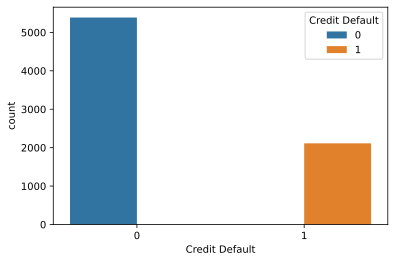

In [14]:
sns.countplot(x='Credit Default', hue='Credit Default', data=df_train)
plt.show()

Данные не сбалансированные, что будет учтено в дальнейшей работе

#### Функции для работы с данными

In [15]:
def mis_values(df):
    '''Функция выводит пропущенные значения в абсолютных величинах и в процентах'''
    mis_val = df.isnull().sum()
    perc_mis_val = 100 * df.isnull().sum() / len(df)
    report = pd.concat([mis_val, perc_mis_val], axis=1)
    report_columns = report.rename(columns = {0: 'Пропущенные значения', 1: '% от всех значений'})
    report_columns = report_columns[report_columns.iloc[:,1] != 0].sort_values('% от всех значений', ascending=False).round(1)
    print('Датафрейм имеет ' + str(df.shape[1]) + ' столбцов.\n' + str(report_columns.shape[0]) + ' столбцов имеют пропущенные значения')
    return report_columns

def bild_hist(name, target_df):
    plt.figure(figsize=(8,5))
    ax1 = plt.subplot(121)
    ax1.set_xlabel(name)
    ax1.set_ylabel('Count')
    ax1.set_title(f'{name} distribution')
    target_df[name].hist()
    plt.subplot(122)
    probplot(target_df[name],dist='norm',plot=plt)

    plt.show()
    
def correl(val, x1, x2, df):
    pay1_and_target_s = df.loc[df[val].isin([x1, x2]), ['ID', val, 'Credit Default']]
    table = pay1_and_target_s.pivot_table(values='ID', index=val, columns='Credit Default', aggfunc='count')
    chi2, p, dof, expected = chi2_contingency(table, correction=False)
    print(p)    
    
def balance_by_target(df, target_name, method='over'):

    assert method in ['over', 'under', 'tomek', 'smote'], 'Неверный метод сэмплирования'
    
    target_counts = df[target_name].value_counts()

    major_class_name = target_counts.argmax()
    minor_class_name = target_counts.argmin()

    disbalance_coeff = int(target_counts[major_class_name] / target_counts[minor_class_name]) - 1
    if method == 'over':
        for i in range(disbalance_coeff):
            sample = df[df[target_name] == minor_class_name].sample(target_counts[minor_class_name])
            df = df.append(sample, ignore_index=True)
            
    elif method == 'under':
        df_ = df.copy()
        df = df_[df_[target_name] == minor_class_name]
        tmp = df_[df_[target_name] == major_class_name]
        df = df.append(tmp.iloc[
            np.random.randint(0, tmp.shape[0], target_counts[minor_class_name])
        ], ignore_index=True)

    elif method == 'tomek':
        from imblearn.under_sampling import TomekLinks
        tl = TomekLinks()
        X_tomek, y_tomek = tl.fit_sample(df.drop(columns=target_name), df[target_name])
        df = pd.concat([X_tomek, y_tomek], axis=1)
    
    elif method == 'smote':
        from imblearn.over_sampling import SMOTE
        smote = SMOTE()
        X_smote, y_smote = smote.fit_sample(df.drop(columns=target_name), df[target_name])
        df = pd.concat([X_smote, y_smote], axis=1)

    return df.sample(frac=1) 

#### Информация о пропусках

In [16]:
df_train.isna().sum()

Home Ownership                     0
Annual Income                   1557
Years in current job             371
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent    4081
Bankruptcies                      14
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                    1557
Credit Default                     0
ID                                 0
dtype: int64

In [17]:
df_test.isna().sum()

Home Ownership                     0
Annual Income                    513
Years in current job              86
Tax Liens                          0
Number of Open Accounts            0
Years of Credit History            0
Maximum Open Credit                0
Number of Credit Problems          0
Months since last delinquent    1358
Bankruptcies                       3
Purpose                            0
Term                               0
Current Loan Amount                0
Current Credit Balance             0
Monthly Debt                       0
Credit Score                     513
dtype: int64

In [18]:
mis_values(df_train)

Датафрейм имеет 18 столбцов.
5 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений
Months since last delinquent,4081,54.4
Annual Income,1557,20.8
Credit Score,1557,20.8
Years in current job,371,4.9
Bankruptcies,14,0.2


In [19]:
mis_values(df_test)

Датафрейм имеет 16 столбцов.
5 столбцов имеют пропущенные значения


,Пропущенные значения,% от всех значений
Months since last delinquent,1358,54.3
Annual Income,513,20.5
Credit Score,513,20.5
Years in current job,86,3.4
Bankruptcies,3,0.1


#### Обработка данных

* Home Ownership - домовладение

In [20]:
df_train['Home Ownership'].value_counts()

Home Mortgage    3637
Rent             3204
Own Home          647
Have Mortgage      12
Name: Home Ownership, dtype: int64

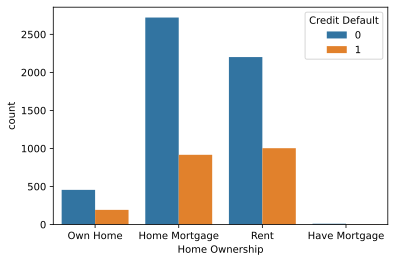

In [21]:
sns.countplot(x="Home Ownership", hue='Credit Default', data=df_train)
plt.show()

In [22]:
df_train = pd.concat([df_train, pd.get_dummies(df_train['Home Ownership'], prefix='Home Ownership')], axis=1)
df_test = pd.concat([df_test, pd.get_dummies(df_test['Home Ownership'], prefix='Home Ownership')], axis=1)

* Annual Income - годовой доход
   

 Заполняем пропуки при помощи Линейной регрессии и немного обрезаем хвос

In [23]:
df_train['Annual Income'].describe()

count    5.943000e+03
mean     1.366392e+06
std      8.453392e+05
min      1.645970e+05
25%      8.443410e+05
50%      1.168386e+06
75%      1.640137e+06
max      1.014934e+07
Name: Annual Income, dtype: float64

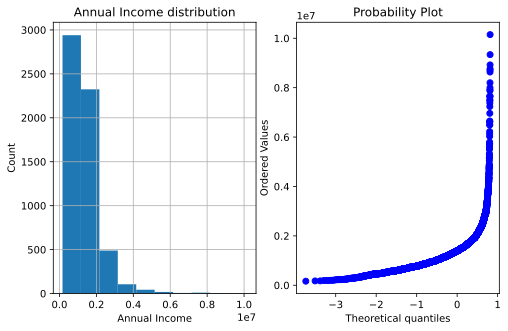

In [24]:
bild_hist('Annual Income', df_train)

Будем заполнять пропуски и выбросы при помощи Линейной регрессии 
Проверим с каким признаком коррелирует больше всего.Ищем корреляцию годового дохода с другими признаками

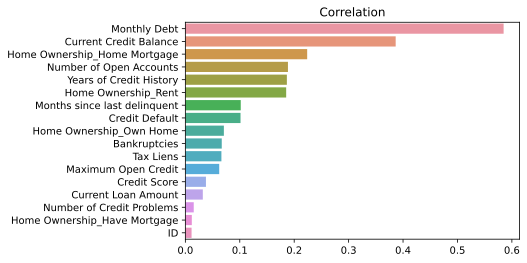

In [26]:
features_name = df_train.columns.drop('Annual Income').tolist()
corr_Annual_Income = df_train[features_name + ['Annual Income']].corr().iloc[:-1, -1]
corr_Annual_Income = np.abs(corr_Annual_Income).sort_values(ascending=False)

sns.barplot(x=corr_Annual_Income.values, y=corr_Annual_Income.index)

plt.title('Correlation')
plt.show()

Для обучения используем первые 6 признаков, тк признак 'Months since last delinquent' имеет много пропусков

In [27]:
target_features = list(corr_Annual_Income.index[0:5])

In [28]:
#отбор данных для обучения
data = df_train.loc[(df_train['Annual Income'].notnull()), target_features + ['Annual Income']]
data

,Monthly Debt,Current Credit Balance,Home Ownership_Home Mortgage,Number of Open Accounts,Years of Credit History,Annual Income
0,7914.0,47386.0,0,11.0,26.3,482087.0
1,18373.0,394972.0,0,15.0,15.3,1025487.0
2,13651.0,308389.0,1,11.0,35.0,751412.0
3,11338.0,95855.0,0,8.0,22.5,805068.0
4,7180.0,93309.0,0,13.0,13.6,776264.0
...,...,...,...,...,...,...
7491,61150.0,108889.0,1,18.0,21.3,2833185.0
7493,27562.0,167428.0,0,14.0,16.5,1257610.0
7495,1900.0,73492.0,0,3.0,8.5,402192.0
7496,12783.0,456399.0,1,10.0,26.5,1533984.0


In [29]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5943 entries, 0 to 7497
Data columns (total 6 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Monthly Debt                  5943 non-null   float64
 1   Current Credit Balance        5943 non-null   float64
 2   Home Ownership_Home Mortgage  5943 non-null   uint8  
 3   Number of Open Accounts       5943 non-null   float64
 4   Years of Credit History       5943 non-null   float64
 5   Annual Income                 5943 non-null   float64
dtypes: float64(5), uint8(1)
memory usage: 284.4 KB


In [30]:
%%time
Annual_Income_model = LogisticRegression()
Annual_Income_model.fit(data[target_features], data['Annual Income'])

Wall time: 4min 33s


LogisticRegression()

In [31]:
# заполняем пропуски на основе обученной модели
df_train.loc[(df_train['Annual Income'].isnull()), ['Annual Income']] =\
Annual_Income_model.predict(df_train.loc[(df_train['Annual Income'].isnull()), target_features])

df_test.loc[(df_test['Annual Income'].isnull()), ['Annual Income']] =\
Annual_Income_model.predict(df_test.loc[(df_test['Annual Income'].isnull()), target_features])

Используем тест Шапиро-Уилка, чтобы посмотреть получившееся распределение

In [32]:
shapiro(df_train['Annual Income'])

ShapiroResult(statistic=0.7478812336921692, pvalue=0.0)

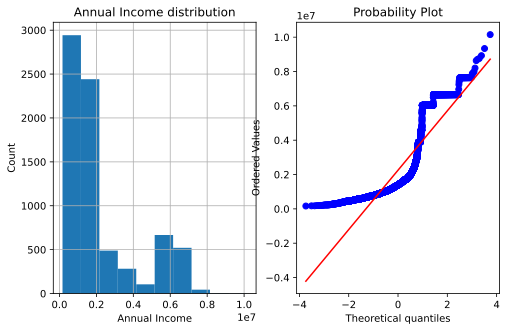

In [33]:
bild_hist('Annual Income', df_train)

In [34]:
Annual_Income_target_s = df_train[['Annual Income', 'Credit Default']]
Annual_Income_target_0 = df_train.loc[df_train['Credit Default'] == 0, ['Annual Income']]
Annual_Income_target_1 = df_train.loc[df_train['Credit Default'] == 1, ['Annual Income']]

In [35]:
mannwhitneyu(Annual_Income_target_0, Annual_Income_target_1)

MannwhitneyuResult(statistic=array([5899258.]), pvalue=array([0.01367006]))

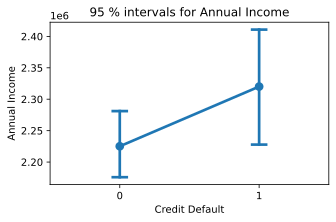

In [36]:
plt.figure(figsize=(5,3))

sns.pointplot(x='Credit Default', y='Annual Income', data=Annual_Income_target_s, capsize=.1)
plt.title('95 % intervals for Annual Income')

plt.show()

In [37]:
# обрезаем хвост

df_train.loc[df_train['Annual Income'] > df_train['Annual Income'].quantile(.99), ['Annual Income']] =\
            df_train['Annual Income'].quantile(.99)  

df_test.loc[df_test['Annual Income'] > df_test['Annual Income'].quantile(.99), ['Annual Income']] = \
            df_test['Annual Income'].quantile(.99) 

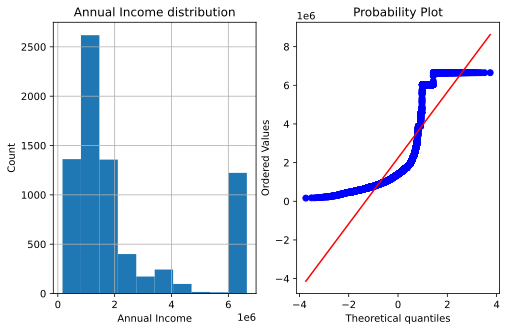

In [38]:
bild_hist('Annual Income', df_train)

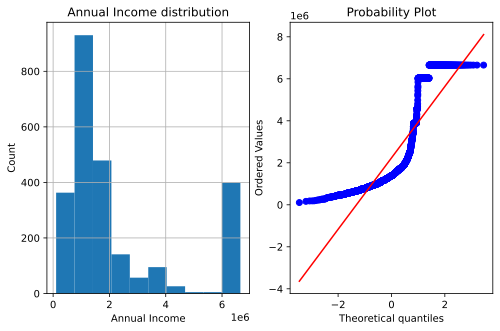

In [39]:
bild_hist('Annual Income', df_test)

* Years in current job - количество лет на текущем месте работы

In [42]:
df_train['Years in current job'].value_counts()

10+ years    2332
2 years       705
3 years       620
< 1 year      563
5 years       516
1 year        504
4 years       469
6 years       426
7 years       396
8 years       339
9 years       259
Name: Years in current job, dtype: int64

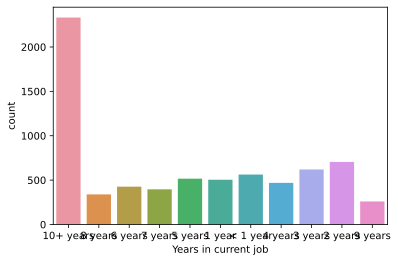

In [43]:
sns.countplot(x="Years in current job", data=df_train)
plt.show()

<AxesSubplot:xlabel='Years in current job', ylabel='count'>

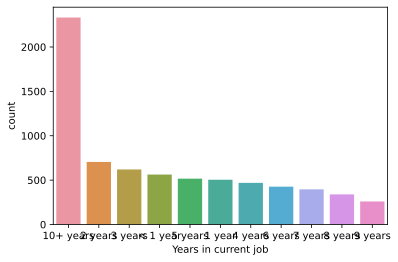

In [44]:
# распределение от стажа 
sns.countplot(df_train['Years in current job'], order = df_train['Years in current job'].value_counts().index)

In [45]:
df_train['Years in current job'] = df_train['Years in current job'].map({
                                                            '10+ years':'10', 
                                                            '9 years':'9',
                                                            '8 years':'8',
                                                            '7 years':'7',
                                                            '6 years':'6',
                                                            '5 years':'5',
                                                            '4 years':'4',
                                                            '3 years':'3',
                                                            '2 years':'2',
                                                            '1 year':'1',
                                                            '< 1 year':'0'
                                                            }).astype(float)

df_train.loc[df_train['Years in current job'].isnull(), 'Years in current job'] = 11



df_test['Years in current job'] = df_test['Years in current job'].map({
                                                            '10+ years':'10', 
                                                            '9 years':'9',
                                                            '8 years':'8',
                                                            '7 years':'7',
                                                            '6 years':'6',
                                                            '5 years':'5',
                                                            '4 years':'4',
                                                            '3 years':'3',
                                                            '2 years':'2',
                                                            '1 year':'1',
                                                            '< 1 year':'0'
                                                            }).astype(float)

df_test.loc[df_test['Years in current job'].isnull(), 'Years in current job'] = 11

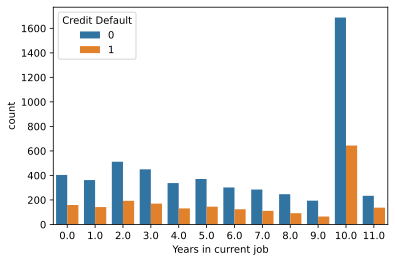

In [46]:
sns.countplot(x="Years in current job", hue='Credit Default', data=df_train)
plt.show()

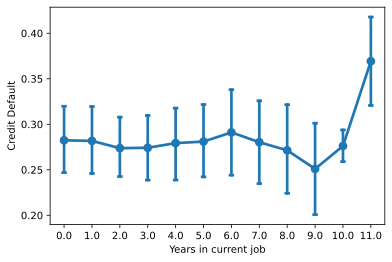

In [47]:
sns.pointplot(x='Years in current job', y='Credit Default', data=df_train, capsize=.1,);

* Tax Liens - налоговые обременения (уйдет в новый признак)

In [48]:
df_train['Tax Liens'].describe()

count    7500.000000
mean        0.030133
std         0.271604
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         7.000000
Name: Tax Liens, dtype: float64

In [49]:
df_train['Tax Liens'].value_counts()

0.0    7366
1.0      83
2.0      30
3.0      10
4.0       6
6.0       2
5.0       2
7.0       1
Name: Tax Liens, dtype: int64

* Number of Open Accounts - количество открытых счетов  (заменяем > 95 квантили меняем медиану)

In [50]:
df_train['Number of Open Accounts'].describe()

count    7500.000000
mean       11.130933
std         4.908924
min         2.000000
25%         8.000000
50%        10.000000
75%        14.000000
max        43.000000
Name: Number of Open Accounts, dtype: float64

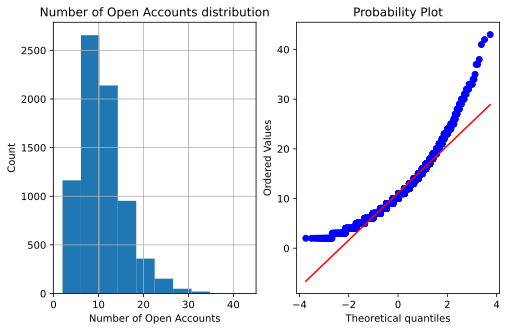

In [51]:
bild_hist('Number of Open Accounts', df_train)

In [52]:
df_train.loc[(df_train['Number of Open Accounts'] > df_train['Number of Open Accounts'].quantile(.95)), :].shape

(356, 22)

In [53]:
df_train.loc[df_train['Number of Open Accounts'] > df_train['Number of Open Accounts'].quantile(.95), ['Number of Open Accounts']] =\
            df_train['Number of Open Accounts'].median()

df_test.loc[df_test['Number of Open Accounts'] > df_test['Number of Open Accounts'].quantile(.95),  \
            ['Number of Open Accounts']] = df_test['Number of Open Accounts'].median()

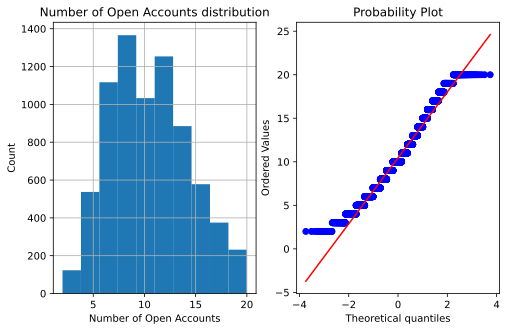

In [54]:
bild_hist('Number of Open Accounts', df_train)

* Years of Credit History - коичество лет кредитной истории  (Если количество лет кредитной истории больше 40, то меняем на 40) 

In [55]:
df_train['Years of Credit History'].value_counts()

15.0    104
16.0     99
16.5     91
17.0     86
17.5     83
       ... 
44.0      1
39.8      1
40.0      1
39.9      1
48.3      1
Name: Years of Credit History, Length: 408, dtype: int64

In [56]:
df_train['Years of Credit History'].describe()

count    7500.000000
mean       18.317467
std         7.041946
min         4.000000
25%        13.500000
50%        17.000000
75%        21.800000
max        57.700000
Name: Years of Credit History, dtype: float64

<AxesSubplot:>

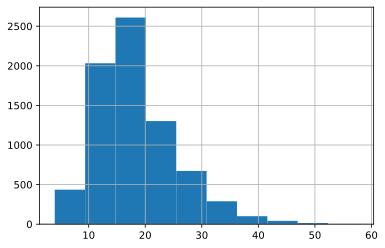

In [57]:
df_train['Years of Credit History'].hist()

In [58]:
# Кредитная история  в 40 лет достаточно много, все что больше 40 лет заменяем на 40 
df_train.loc[df_train['Years of Credit History'] > 40, ['Years of Credit History']] = 40

df_test.loc[df_test['Years of Credit History'] > 40, ['Years of Credit History']] = 40

<AxesSubplot:>

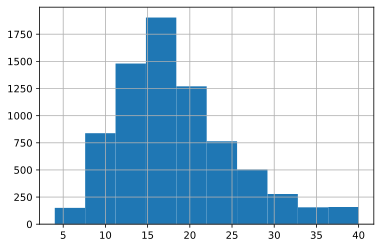

In [59]:
df_train['Years of Credit History'].hist()

<AxesSubplot:>

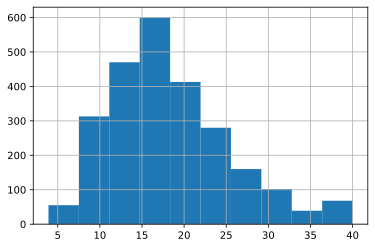

In [60]:
df_test['Years of Credit History'].hist()

* Maximum Open Credit - наибольший открытый кредит   (заменяем > 95 квантили  на = 95 квантили)

In [61]:
df_train['Maximum Open Credit'].describe()

count    7.500000e+03
mean     9.451537e+05
std      1.602622e+07
min      0.000000e+00
25%      2.792295e+05
50%      4.781590e+05
75%      7.935015e+05
max      1.304726e+09
Name: Maximum Open Credit, dtype: float64

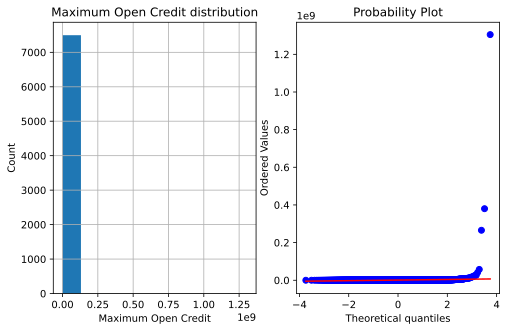

In [62]:
bild_hist('Maximum Open Credit', df_train)

In [63]:
df_train.loc[df_train['Maximum Open Credit'] > df_train['Maximum Open Credit'].quantile(.95), ['Maximum Open Credit']] =\
            df_train['Maximum Open Credit'].quantile(.95)

df_test.loc[df_test['Maximum Open Credit'] > df_test['Maximum Open Credit'].quantile(.95), ['Maximum Open Credit']] =\
            df_test['Maximum Open Credit'].quantile(.95)

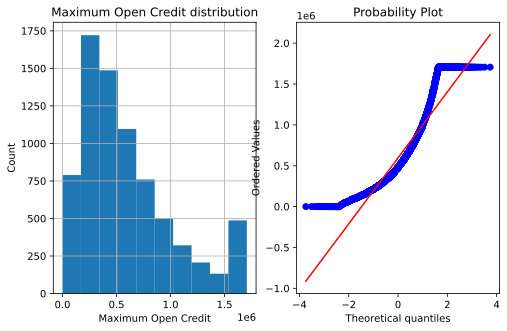

In [64]:
bild_hist('Maximum Open Credit', df_train)

* Number of Credit Problems - количество проблем с кредитом  (уйдет в новый признак)

In [65]:
df_train['Number of Credit Problems'].value_counts()

0.0    6469
1.0     882
2.0      93
3.0      35
4.0       9
5.0       7
6.0       4
7.0       1
Name: Number of Credit Problems, dtype: int64

In [66]:
df_train['Number of Credit Problems'].describe()

count    7500.000000
mean        0.170000
std         0.498598
min         0.000000
25%         0.000000
50%         0.000000
75%         0.000000
max         7.000000
Name: Number of Credit Problems, dtype: float64

* Bankruptcies - банкротства (уйдет в овый признак)

In [67]:
df_train['Bankruptcies'].value_counts()

0.0    6660
1.0     786
2.0      31
3.0       7
4.0       2
Name: Bankruptcies, dtype: int64

In [68]:
df_train.loc[df_train['Bankruptcies'].isnull(), 'Bankruptcies'] = 0
df_test.loc[df_test['Bankruptcies'].isnull(), 'Bankruptcies'] = 0

* Months since last delinquent - количество месяцев с последней просрочки кредита

In [69]:
df_train['Months since last delinquent'].describe()

count    3419.000000
mean       34.692600
std        21.688806
min         0.000000
25%        16.000000
50%        32.000000
75%        50.000000
max       118.000000
Name: Months since last delinquent, dtype: float64

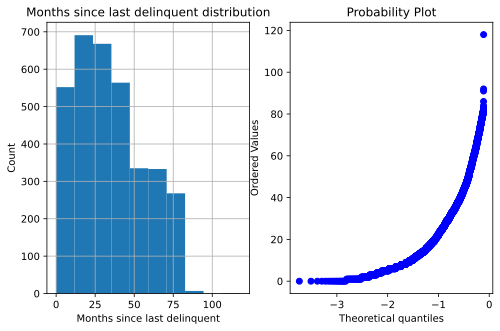

In [70]:
bild_hist('Months since last delinquent', df_train)

In [71]:
df_train['Months since last delinquent NULL'] = df_train['Months since last delinquent'].isnull()
df_train.loc[df_train['Months since last delinquent'].isnull(), 'Months since last delinquent'] = 0

df_test['Months since last delinquent NULL'] = df_test['Months since last delinquent'].isnull()
df_test.loc[df_test['Months since last delinquent'].isnull(), 'Months since last delinquent'] = 0

* Purpose - цель кредита (объединяем в 4 категории)

In [72]:
df_train['Purpose'].value_counts()

debt consolidation      5944
other                    665
home improvements        412
business loan            129
buy a car                 96
medical bills             71
major purchase            40
take a trip               37
buy house                 34
small business            26
wedding                   15
moving                    11
educational expenses      10
vacation                   8
renewable energy           2
Name: Purpose, dtype: int64

In [73]:
df_test['Purpose'].value_counts()

debt consolidation      1973
other                    240
home improvements        140
buy a car                 34
business loan             30
medical bills             27
buy house                 19
take a trip               14
major purchase             9
small business             5
educational expenses       3
vacation                   3
wedding                    2
moving                     1
Name: Purpose, dtype: int64

<AxesSubplot:title={'center':'Purpose'}>

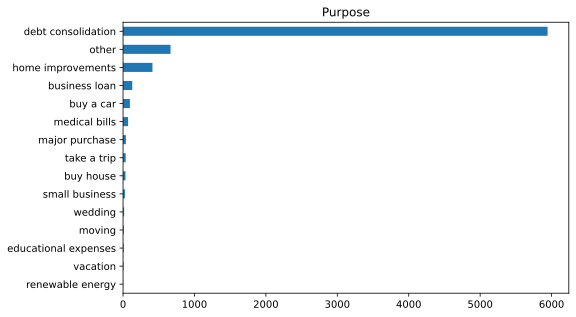

In [74]:
df_train['Purpose'].value_counts().sort_values(ascending=True).plot(kind='barh', title='Purpose', figsize=(8,5))

<AxesSubplot:title={'center':'Purpose / Credit Default'}, xlabel='Purpose'>

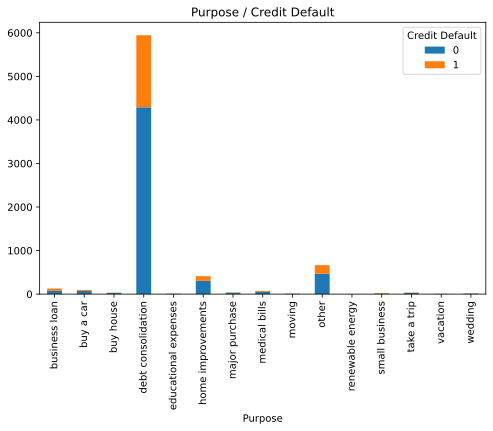

In [75]:
purpose_by_deafult = df_train[['Purpose','Credit Default']]
pd.crosstab(purpose_by_deafult['Purpose'], purpose_by_deafult['Credit Default']).plot \
(kind='bar', stacked=True, figsize=(8,5), title="Purpose / Credit Default", )

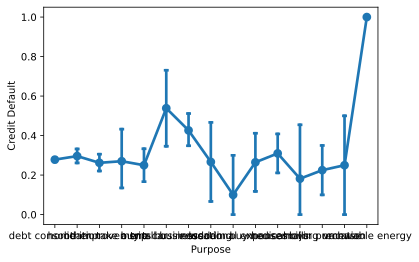

In [76]:
sns.pointplot(x='Purpose', y='Credit Default', data=df_train, capsize=.1,);

In [77]:
df_train['Purpose'] = df_train['Purpose'].map({
                                'debt consolidation':'0', 
                                'other':'0',
                                'home improvements':'0',
                                'business loan':'1',
                                'buy a car':'0',
                                'medical bills':'0',
                                'major purchase':'0',
                                'take a trip':'0',
                                'buy house':'0',
                                'small business':'2',
                                'wedding':'0',
                                'moving':'0',
                                'educational expenses':'3',
                                'vacation':'0',
                                'renewable energy':'0'
                                }).astype(float)

In [78]:
df_test['Purpose'] = df_test['Purpose'].map({
                                'debt consolidation':'0', 
                                'other':'0',
                                'home improvements':'0',
                                'business loan':'1',
                                'buy a car':'0',
                                'medical bills':'0',
                                'major purchase':'0',
                                'take a trip':'0',
                                'buy house':'0',
                                'small business':'2',
                                'wedding':'0',
                                'moving':'0',
                                'educational expenses':'3',
                                'vacation':'0',
                                'renewable energy':'0'
                                }).astype(float)

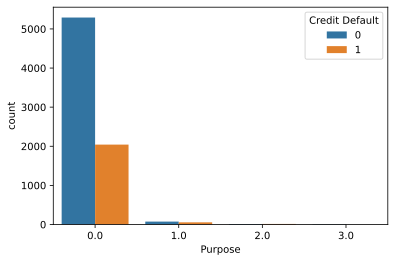

In [79]:
sns.countplot(x="Purpose", hue='Credit Default', data=df_train)
plt.show()

* Term - срок кредита

In [80]:
df_train['Term'].value_counts()

Short Term    5556
Long Term     1944
Name: Term, dtype: int64

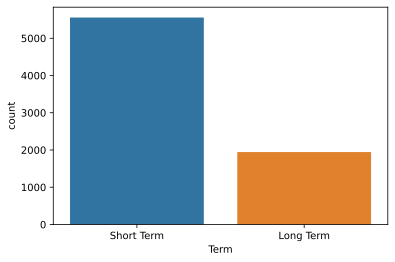

In [81]:
sns.countplot(x="Term", data=df_train)
plt.show()

In [82]:
df_train['Term'] = df_train['Term'].map({'Short Term':'1', 'Long Term':'0'}).astype(float)
df_test['Term'] = df_test['Term'].map({'Short Term':'1', 'Long Term':'0'}).astype(float)

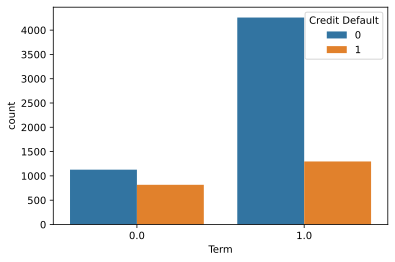

In [83]:
sns.countplot(x="Term", hue='Credit Default', data=df_train)
plt.show()

In [84]:
correl('Term',0,1, df_train)

1.1519373940439208e-55


* Current Loan Amount - текущая сумма кредита (выбросы в отдельную категорию и меняем > 95 квантили на среднюю величину)

In [85]:
df_train['Current Loan Amount'].describe()

count    7.500000e+03
mean     1.187318e+07
std      3.192612e+07
min      1.124200e+04
25%      1.801690e+05
50%      3.095730e+05
75%      5.198820e+05
max      1.000000e+08
Name: Current Loan Amount, dtype: float64

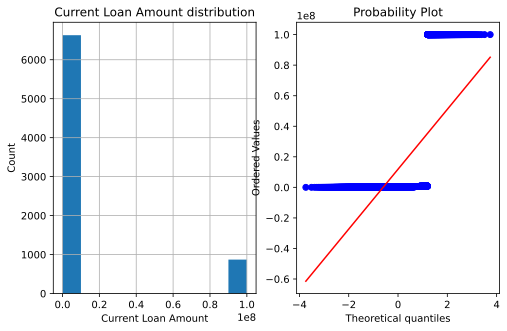

In [86]:
bild_hist('Current Loan Amount', df_train)

In [87]:
# убираем большие выбросов в отдельную переменную

df_train['Current Loan Amount BIG'] = df_train['Current Loan Amount'] == 99999999
df_test['Current Loan Amount BIG'] = df_test['Current Loan Amount'] == 99999999

In [88]:
df_train.loc[df_train['Current Loan Amount'] == 99999999, ['Current Loan Amount']] = None
df_test.loc[df_test['Current Loan Amount'] == 99999999, ['Current Loan Amount']] = None

In [89]:
df_train.loc[df_train['Current Loan Amount'].isnull(), 'Current Loan Amount'] = df_train['Current Loan Amount'].mean() 
df_test.loc[df_test['Current Loan Amount'].isnull(), 'Current Loan Amount'] = df_test['Current Loan Amount'].mean()

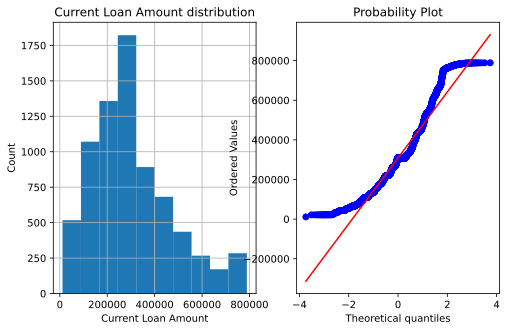

In [90]:
bild_hist('Current Loan Amount', df_train)

* Current Credit Balance - текущий кредитный баланс

In [91]:
df_train['Current Credit Balance'].describe()

count    7.500000e+03
mean     2.898332e+05
std      3.178714e+05
min      0.000000e+00
25%      1.142565e+05
50%      2.093230e+05
75%      3.604062e+05
max      6.506797e+06
Name: Current Credit Balance, dtype: float64

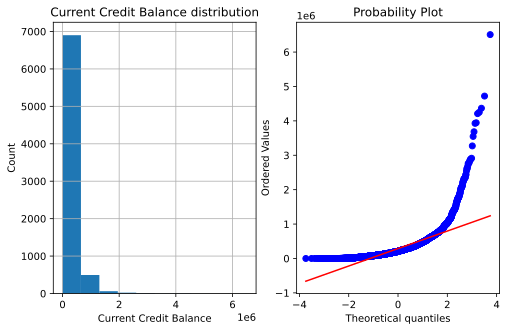

In [92]:
bild_hist('Current Credit Balance', df_train)

In [93]:
# выбросы

df_train.loc[df_train['Current Credit Balance'] > df_train['Current Credit Balance'].quantile(.95), :].shape

(375, 24)

In [94]:
df_train.loc[df_train['Current Credit Balance'] > df_train['Current Credit Balance'].quantile(.95), \
       ['Current Credit Balance']] = df_train['Current Credit Balance'].quantile(.95) 

df_test.loc[df_test['Current Credit Balance'] > df_test['Current Credit Balance'].quantile(.95), \
       ['Current Credit Balance']] = df_test['Current Credit Balance'].quantile(.95)

* Monthly Debt - ежемесячный долг (меняем >99 проц на среднее)

<AxesSubplot:>

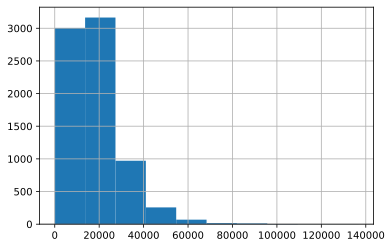

In [95]:
df_train['Monthly Debt'].hist()

<AxesSubplot:>

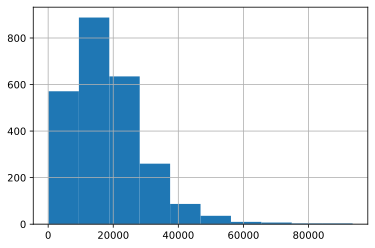

In [96]:
df_test['Monthly Debt'].hist()

In [97]:
df_train.loc[df_train['Monthly Debt'] > df_train['Monthly Debt'].quantile(.99), \
       ['Monthly Debt']] = df_train['Monthly Debt'].mean()

df_test.loc[df_test['Monthly Debt'] > df_test['Monthly Debt'].quantile(.99), \
       ['Monthly Debt']] = df_test['Monthly Debt'].mean()

<AxesSubplot:>

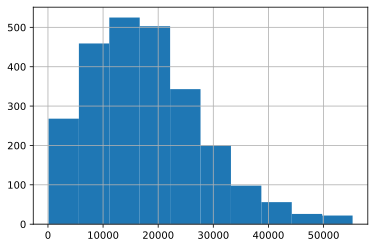

In [98]:
df_test['Monthly Debt'].hist()

* Credit Score - кредитный рейтинг (Заполняем пропуки при помощи Линейной регрессии и делим на категории)

In [99]:
df_train['Credit Score'].describe()

count    5943.000000
mean     1151.087498
std      1604.451418
min       585.000000
25%       711.000000
50%       731.000000
75%       743.000000
max      7510.000000
Name: Credit Score, dtype: float64

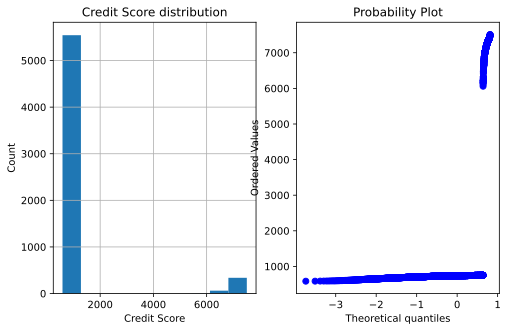

In [100]:
bild_hist('Credit Score', df_train)

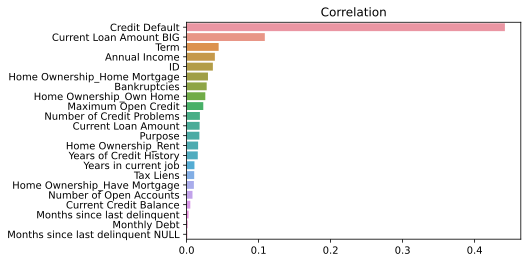

In [101]:
# смотрим, как коррелируют признаки с 'Credit Score'

feature_names = df_train.columns.drop('Credit Score').tolist()
corr_Credit_Score = df_train[feature_names + ['Credit Score']].corr().iloc[:-1, -1]
corr_Credit_Score = np.abs(corr_Credit_Score).sort_values(ascending=False)

sns.barplot(x=corr_Credit_Score.values, y=corr_Credit_Score.index)

plt.title('Correlation')
plt.show()

In [102]:
# для обучения выбираем 7 наиболее влияющих признаков
TARGET_FEATURE = [
                 'Current Loan Amount BIG',
                 'Current Loan Amount',
                 'Term',
                 'Annual Income',
                 'Home Ownership_Home Mortgage',
                 'Bankruptcies',
                 'Home Ownership_Own Home',
                 'Maximum Open Credit',
                 'Number of Credit Problems',
                 'Purpose',
                 'Home Ownership_Rent',
                 'Years of Credit History',
                 'Years in current job'
                 ]

In [103]:
# отбираем набор данных для обучения
data = df_train.loc[(df_train['Credit Score'].notnull()), TARGET_FEATURE + ['Credit Score']]


In [104]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5943 entries, 0 to 7497
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Current Loan Amount BIG       5943 non-null   bool   
 1   Current Loan Amount           5943 non-null   float64
 2   Term                          5943 non-null   float64
 3   Annual Income                 5943 non-null   float64
 4   Home Ownership_Home Mortgage  5943 non-null   uint8  
 5   Bankruptcies                  5943 non-null   float64
 6   Home Ownership_Own Home       5943 non-null   uint8  
 7   Maximum Open Credit           5943 non-null   float64
 8   Number of Credit Problems     5943 non-null   float64
 9   Purpose                       5943 non-null   float64
 10  Home Ownership_Rent           5943 non-null   uint8  
 11  Years of Credit History       5943 non-null   float64
 12  Years in current job          5943 non-null   float64
 13  Cre

In [105]:
%%time

# учимся на Регрессии

model_Credit_Score = LogisticRegression()
model_Credit_Score.fit(data[TARGET_FEATURE], data['Credit Score'])

Wall time: 18.5 s


LogisticRegression()

In [1]:
# заполняем пропуски на основе обученной модели

df_train.loc[(df_train['Credit Score'].isnull()), ['Credit Score']] =\
model_Credit_Score.predict(df_train.loc[(df_train['Credit Score'].isnull()), TARGET_FEATURE])

df_test.loc[(df_test['Credit Score'].isnull()), ['Credit Score']] =\
model_Credit_Score.predict(df_test.loc[(df_test['Credit Score'].isnull()), TARGET_FEATURE])

NameError: name 'model_Credit_Score' is not defined

In [228]:
# смотрим, какое распределение получилось
shapiro(df_train['Credit Score'])

ShapiroResult(statistic=0.24976158142089844, pvalue=0.0)

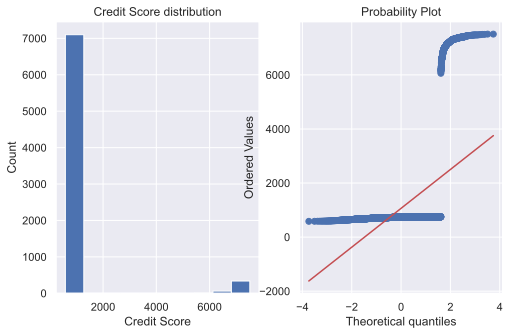

In [229]:
bild_hist('Credit Score', df_train)

In [230]:
df_train.loc[(df_train['Credit Score'] < 700), 'Credit Score'] = 0
df_train.loc[(df_train['Credit Score'] >= 700) & (df_train['Credit Score'] < 740), 'Credit Score'] = 1

df_train.loc[(df_train['Credit Score'] >= 740) & (df_train['Credit Score'] <= 750), 'Credit Score'] = 2
df_train.loc[(df_train['Credit Score'] >= 750) & (df_train['Credit Score'] <= 800), 'Credit Score'] = 3
df_train.loc[(df_train['Credit Score'] > 800), 'Credit Score'] = 4

In [231]:
df_test.loc[(df_test['Credit Score'] < 700), 'Credit Score'] = 0
df_test.loc[(df_test['Credit Score'] >= 700) & (df_test['Credit Score'] < 740), 'Credit Score'] = 1
df_test.loc[(df_test['Credit Score'] >= 740) & (df_test['Credit Score'] <= 750), 'Credit Score'] = 2
df_test.loc[(df_test['Credit Score'] >= 750) & (df_test['Credit Score'] <= 800), 'Credit Score'] = 3
df_test.loc[(df_test['Credit Score'] > 800), 'Credit Score'] = 4

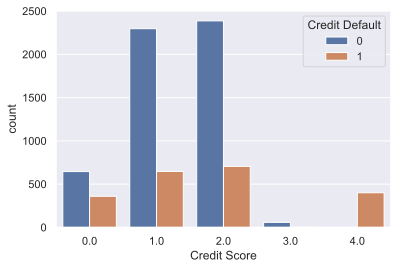

In [232]:
sns.countplot(x="Credit Score", hue='Credit Default', data=df_train)
plt.show()

 * Создаем новый признак вместо Tax Liens, Number of Credit Problems и Bankruptcies

In [233]:
df_train['No problems'] = (df_train['Tax Liens'] == 0) & (df_train['Bankruptcies'] == 0) & (df_train['Number of Credit Problems'] == 0)
df_test['No problems'] = (df_test['Number of Credit Problems'] == 0) \
                                & (df_test['Bankruptcies'] == 0) & (df_test['Tax Liens'] == 0)

In [235]:
df_train['No problems'].value_counts()

True     6469
False    1031
Name: No problems, dtype: int64

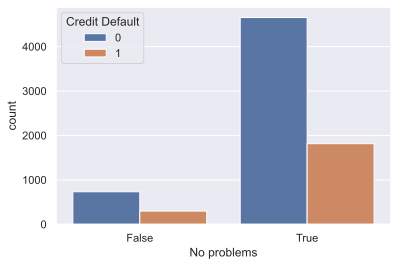

In [237]:
sns.countplot(x="No problems", hue='Credit Default', data=df_train)
plt.show()

#### Смотрим, какие получились данные

In [238]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7500 entries, 0 to 7499
Data columns (total 25 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Home Ownership                     7500 non-null   object 
 1   Annual Income                      7500 non-null   float64
 2   Years in current job               7500 non-null   float64
 3   Tax Liens                          7500 non-null   float64
 4   Number of Open Accounts            7500 non-null   float64
 5   Years of Credit History            7500 non-null   float64
 6   Maximum Open Credit                7500 non-null   float64
 7   Number of Credit Problems          7500 non-null   float64
 8   Months since last delinquent       7500 non-null   float64
 9   Bankruptcies                       7500 non-null   float64
 10  Purpose                            7500 non-null   float64
 11  Term                               7500 non-null   float

In [240]:
# переделываем Purpose во FLOAT, потому-что некоторые алгоритмы отказываются работать с object
df_train['Purpose'] = df_train['Purpose'].astype(float)
df_test['Purpose'] = df_test['Purpose'].astype(float)

In [241]:
# выбираем рабочие столбцы

COL_SELECTED = [
    'Current Loan Amount BIG',
    'No problems',
        'Annual Income',
        'Years in current job',
        'Number of Open Accounts',
        'Years of Credit History',
        'Maximum Open Credit',
        'Purpose',
        'Term',
        'Current Loan Amount',
        'Current Credit Balance',
        'Monthly Debt',
        'Credit Score',    
        'Home Ownership_Have Mortgage',
        'Home Ownership_Home Mortgage',
        'Home Ownership_Own Home',
        'Home Ownership_Rent'
                                ]

In [242]:
# выбираем числовые столбцы (чтобы статистику построить)

COL_SELECTED_NUM = [
        'Annual Income',
        'Years in current job',
        'Number of Open Accounts',
        'Years of Credit History',
        'Maximum Open Credit',
        'Current Loan Amount',
        'Current Credit Balance',
        'Monthly Debt',
        'Credit Score'
                         ]

Annual Income
MannwhitneyuResult(statistic=9380011.0, pvalue=0.9680104788128279)


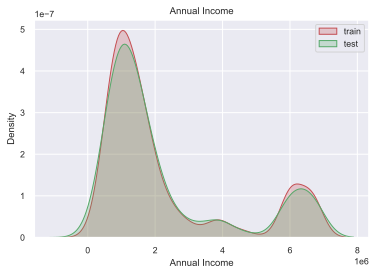

Years in current job
MannwhitneyuResult(statistic=9424506.5, pvalue=0.6869539783622054)


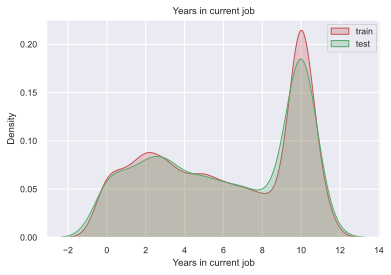

Number of Open Accounts
MannwhitneyuResult(statistic=9268381.0, pvalue=0.3920873152216785)


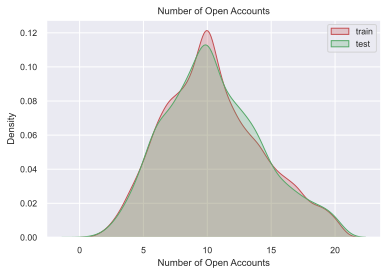

Years of Credit History
MannwhitneyuResult(statistic=9410314.0, pvalue=0.7775607366201247)


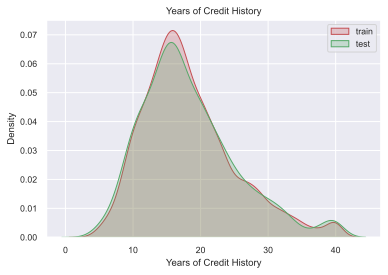

Maximum Open Credit
MannwhitneyuResult(statistic=9314533.5, pvalue=0.6285866111788281)


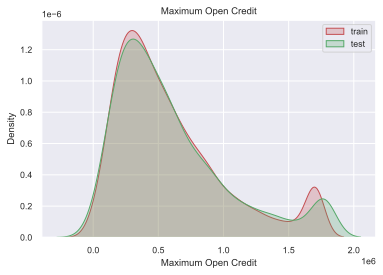

Current Loan Amount
MannwhitneyuResult(statistic=9074421.5, pvalue=0.016157982300107374)


In [ ]:
# смотрим похоже или нет распределения непрерывных показателей на train и test

from scipy.stats import mannwhitneyu

# p > 5% - распределения похожи
for col in COL_SELECTED_NUM:
    sns.set(font_scale=0.8)
    sns.kdeplot(df_train[col], shade=True, label='train', color='r')
    sns.kdeplot(df_test[col], shade=True, label='test', color='g')
    print(col)
    print(mannwhitneyu(df_train[col], df_test[col]))
    plt.legend()
    plt.title(col)
    plt.show()

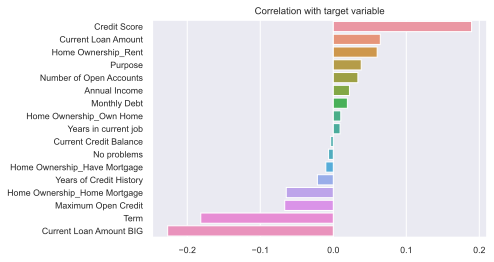

In [246]:
# смотрим влияния столбцов на целевой признак

corr_with_target = df_train[COL_SELECTED + ['Credit Default']].corr().iloc[:-1, -1].sort_values(ascending=False)
sns.barplot(x=corr_with_target.values, y=corr_with_target.index)
plt.title('Correlation with target variable')
plt.show()

#### Балансировка целевой переменной. Разбиение на trein и test.

In [247]:
X = df_train[COL_SELECTED]
y = df_train['Credit Default']

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    shuffle=True,
                                                    test_size=0.30, 
                                                    random_state=21)

In [248]:
# как сбалансирована целевая переменная
disbalance = y_train.value_counts()[0] / y_train.value_counts()[1]
disbalance

2.5496957403651117

In [251]:
# Балансировка целевой переменной

df_for_balancing = pd.concat([X_train, y_train], axis=1)
df_balanced = balance_by_target(df_for_balancing, 'Credit Default')
df_balanced['Credit Default'].value_counts()

0    3771
1    2958
Name: Credit Default, dtype: int64

In [252]:
X_train = df_balanced.drop(columns='Credit Default')
y_train = df_balanced['Credit Default']

In [253]:
# Что получилось
disbalance = y_train.value_counts()[0] / y_train.value_counts()[1]
disbalance

1.2748478701825559

#### Обучение на моделях

Была оставлена ансамбль на нескольких моделях, тк он давал лучший результат

In [255]:
model_vote = VotingClassifier(
    estimators=[
        ('LightGBM', lgbm.LGBMClassifier(class_weight={0:1, 1:3.3}, random_state=21)),
        ('CatBooster', 
                            catb.CatBoostClassifier(class_weights=[1, 3.3], 
                                    depth=3,
                                    iterations=400,
                                    silent=True, 
                                    )),
        ('Extra Tree', 
                ExtraTreesClassifier(random_state=42, bootstrap=True, min_samples_split=0.3, class_weight='balanced')),

    ],

    voting='soft', 
    weights=[1,1.5,1],
    n_jobs=-1)

model_vote.fit(X_train, y_train)

y_train_pred = model_vote.predict(X_train)
y_test_pred = model_vote.predict(X_test)

print('VOTE:: ')
print(f1_score(y_test, y_test_pred))


VOTE:: 
0.5147329650092082


In [256]:
# сохраняем результат

df_test["Credit Default"] = model_vote.predict(df_test[COL_SELECTED])

df_test['ID'] = df_test.index.tolist()
df_test['ID'] = df_test['ID']
df_test1 = df_test[['Credit Default', 'ID']]

df_test1.to_csv('OsipovaA_predictions.csv', index=False)
